In [1]:
import matplotlib as mpl
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams["font.sans-serif"] = "Arial"
warnings.filterwarnings('ignore')

sc.settings.set_figure_params(dpi=80, dpi_save=300, facecolor='white')
%config InlineBackend.figure_format = 'retina'

# Load data

In [2]:
adata = sc.read_visium('./data/Human_Lymph_Node',
                       count_file='V1_Human_Lymph_Node_filtered_feature_bc_matrix.h5'
                       ,source_image_path='./data/Human_Lymph_Node/V1_Human_Lymph_Node_image.tif'
                      )
adata.var_names_make_unique()
adata

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 4035 × 36601
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [3]:
adata.obsm['spatial']

array([[8346, 6982],
       [4270, 1363],
       [2635, 8074],
       ...,
       [3181, 6396],
       [4153, 9747],
       [4822, 1840]])

# visualization of Spatial data

... storing 'feature_types' as categorical
... storing 'genome' as categorical


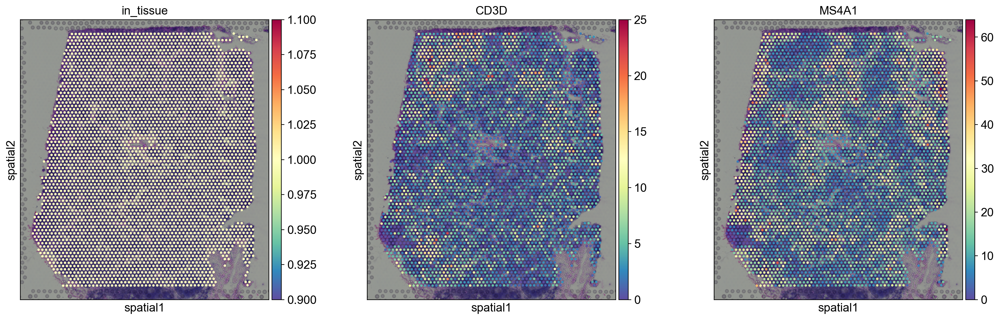

In [4]:
sc.set_figure_params(facecolor="white", figsize=(6, 6), dpi_save=300, dpi=100)
sc.pl.spatial(adata, img_key="hires", color=['in_tissue','CD3D', 'MS4A1'], cmap='Spectral_r', ncols=3,
              basis='spatial', img=None, size=1.0,spot_size=None,bw=False, alpha_img=1.
             )

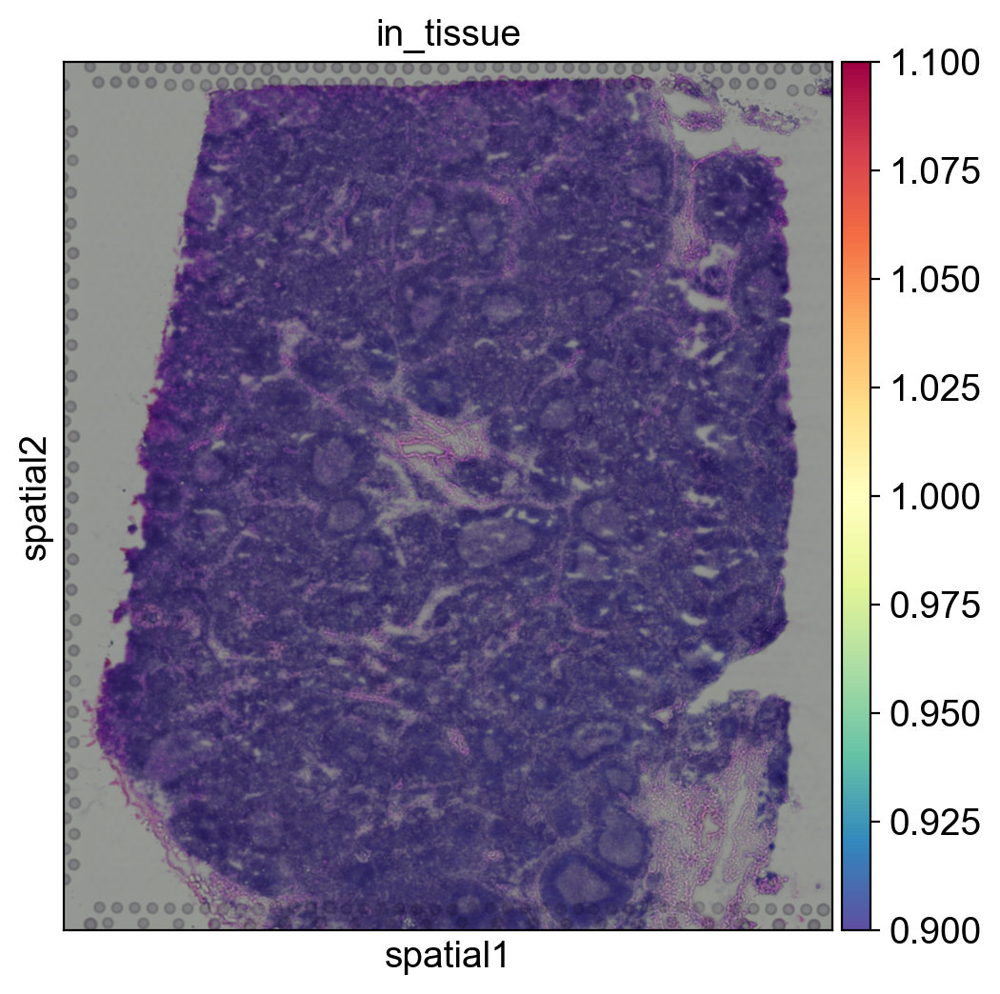

In [5]:
sc.pl.spatial(adata, img_key="hires", color=['in_tissue'], cmap='Spectral_r',spot_size=0)  # crop_coord=[1396, 9571, 992, 10231]

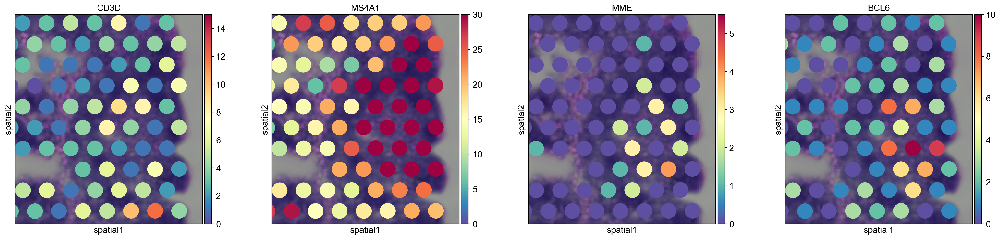

In [6]:
sc.set_figure_params(facecolor="white", figsize=(6, 6), dpi=100)
sc.pl.spatial(adata, img_key="hires", color=['CD3D', 'MS4A1', 'MME', 'BCL6'], cmap='Spectral_r', ncols=4,
              basis='spatial', crop_coord=[8500, 9571, 2500, 3700], vmax=[15, 30, 5.5, 10]
             )

crop_coord = ['left', 'right', 'top', 'bottom']

In [7]:
adata.obsm['spatial'].min(axis=0)

array([1396,  992])

In [8]:
adata.obsm['spatial'].max(axis=0)

array([ 9571, 10231])

# explore the data structure

In [ ]:
## Data model: https://anndata.readthedocs.io/en/latest/

In [9]:
adata.uns['spatial'].keys()

dict_keys(['V1_Human_Lymph_Node'])

In [10]:
adata.uns['spatial']['V1_Human_Lymph_Node'].keys()

dict_keys(['images', 'scalefactors', 'metadata'])

In [12]:
adata.uns['spatial']['V1_Human_Lymph_Node']['scalefactors']

{'spot_diameter_fullres': 89.48996643177776,
 'tissue_hires_scalef': 0.17011142,
 'fiducial_diameter_fullres': 144.56071500517945,
 'tissue_lowres_scalef': 0.051033426}

In [13]:
adata.uns['spatial']['V1_Human_Lymph_Node']['metadata']

{'chemistry_description': "Spatial 3' v1",
 'software_version': 'spaceranger-1.1.0',
 'source_image_path': '/home/liunianping/workspace/projects/ContentShare/spatial_transcriptome/data/Human_Lymph_Node/V1_Human_Lymph_Node_image.tif'}

In [11]:
adata.uns['spatial']['V1_Human_Lymph_Node']['images'].keys()

dict_keys(['hires', 'lowres'])

In [ ]:
adata.uns['spatial']['V1_Human_Lymph_Node']['images']['hires'].shape

# clustering analysis(classical scRNA-seq analysis workflow)

In [14]:
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

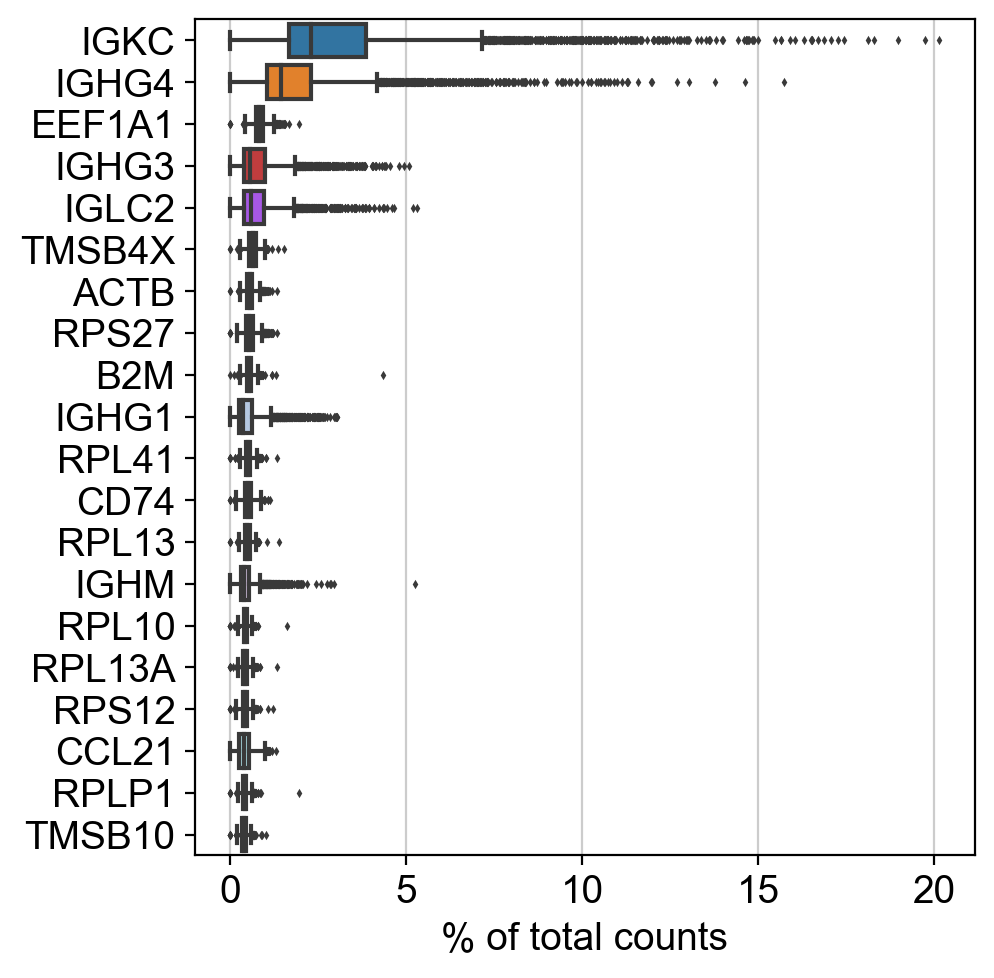

In [15]:
sc.pl.highest_expr_genes(adata, n_top=20)

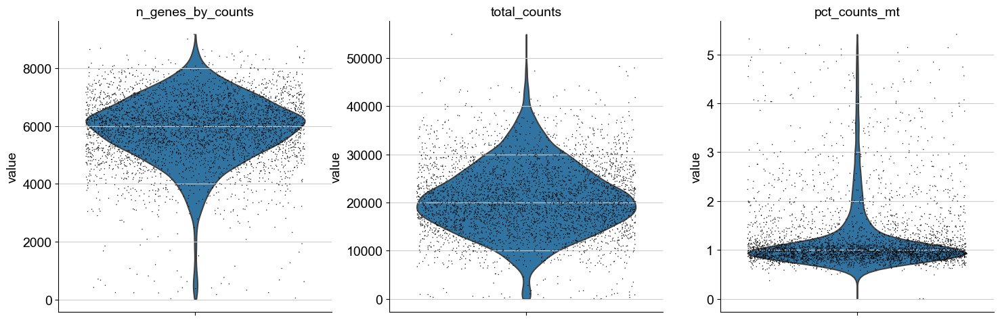

In [16]:
sc.set_figure_params(facecolor="white", figsize=(3,3), dpi_save=300, dpi=50)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

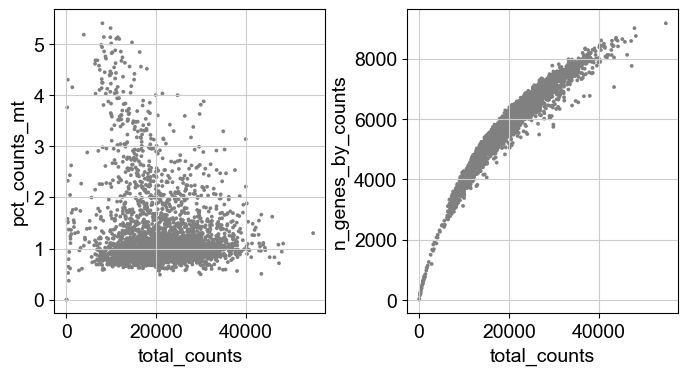

In [17]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8,4))
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', show=False, ax=axes[0])
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', show=False, ax=axes[1])
plt.subplots_adjust(wspace=.3)

In [18]:
sc.pp.filter_cells(adata, min_counts=5000)
sc.pp.filter_cells(adata, max_counts=35000)
adata = adata[adata.obs["pct_counts_mt"] < 20]
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

#cells after MT filter: 3861


Trying to set attribute `.var` of view, copying.


In [19]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

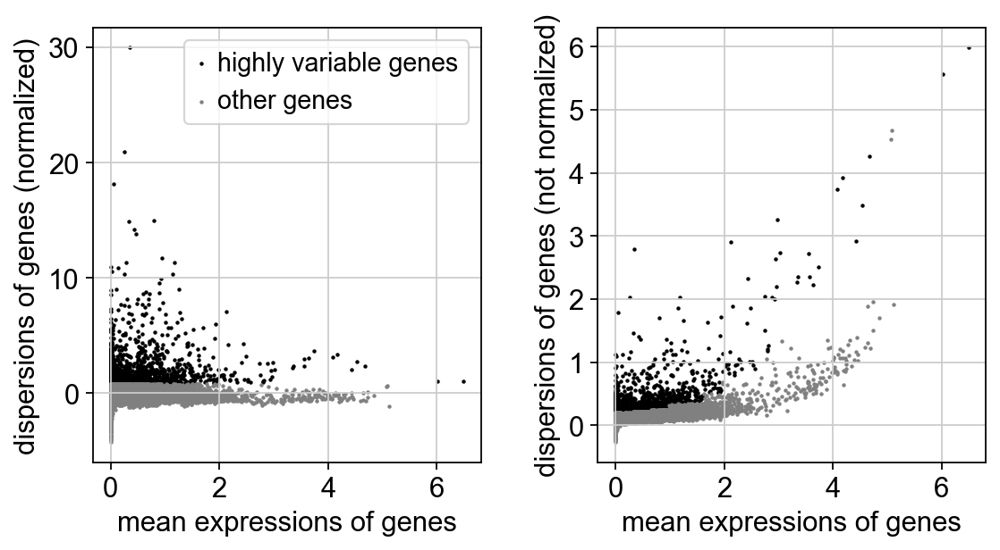

In [20]:
sc.set_figure_params(facecolor="white", dpi_save=300, dpi=80)
sc.pl.highly_variable_genes(adata)

In [21]:
adata.raw = adata
adata = adata[:, adata.var.highly_variable]

In [22]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

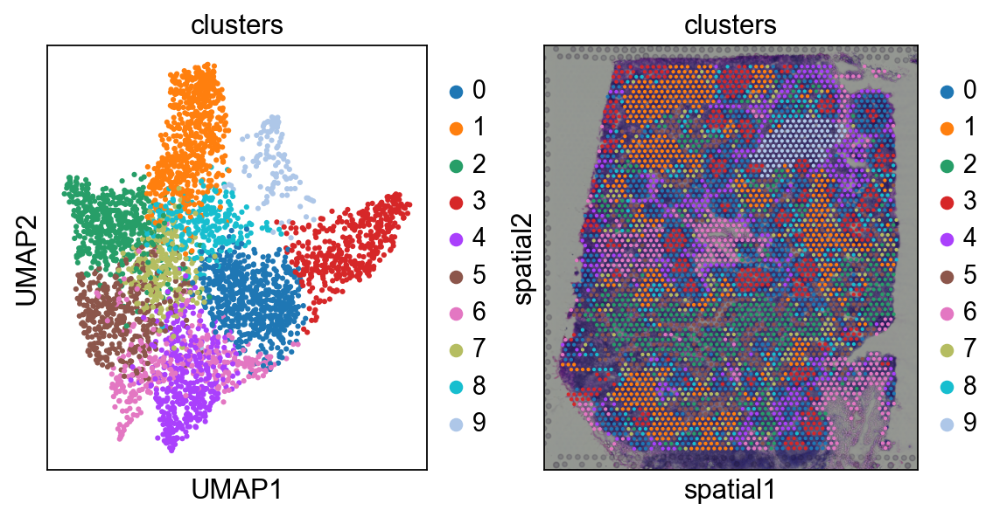

In [23]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8,4))
sc.pl.umap(adata, color=["clusters"], wspace=0.4, ax=axes[0], show=False)
sc.pl.spatial(adata, img_key="hires", color=['clusters'], ax=axes[1], show=False)
plt.subplots_adjust(wspace=.3)

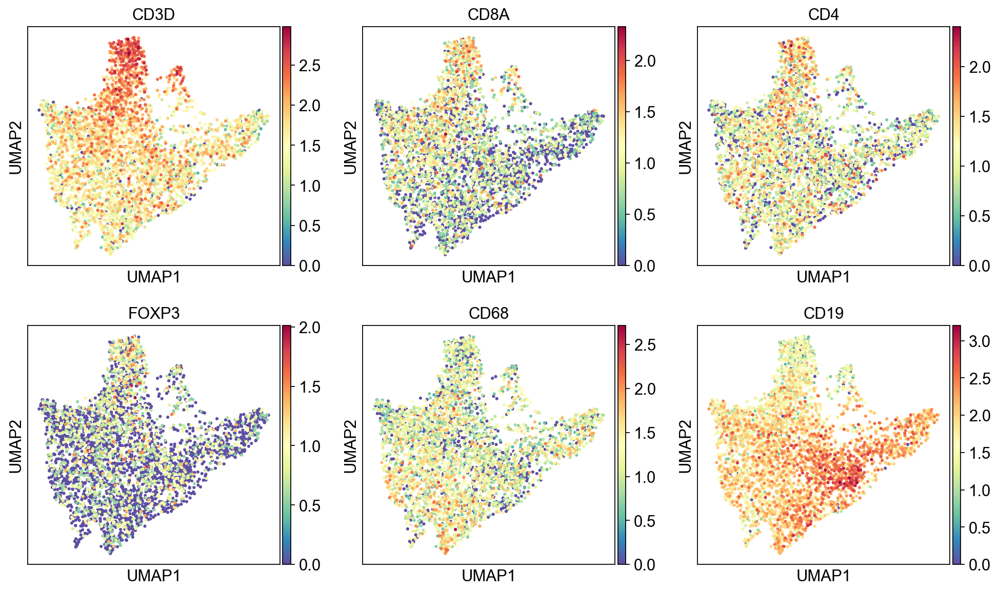

In [24]:
sc.pl.umap(adata, color=["CD3D", 'CD8A', 'CD4', 'FOXP3', 'CD68', 'CD19'], cmap='Spectral_r', ncols=3
#            ,save='.markers.pdf'
          )

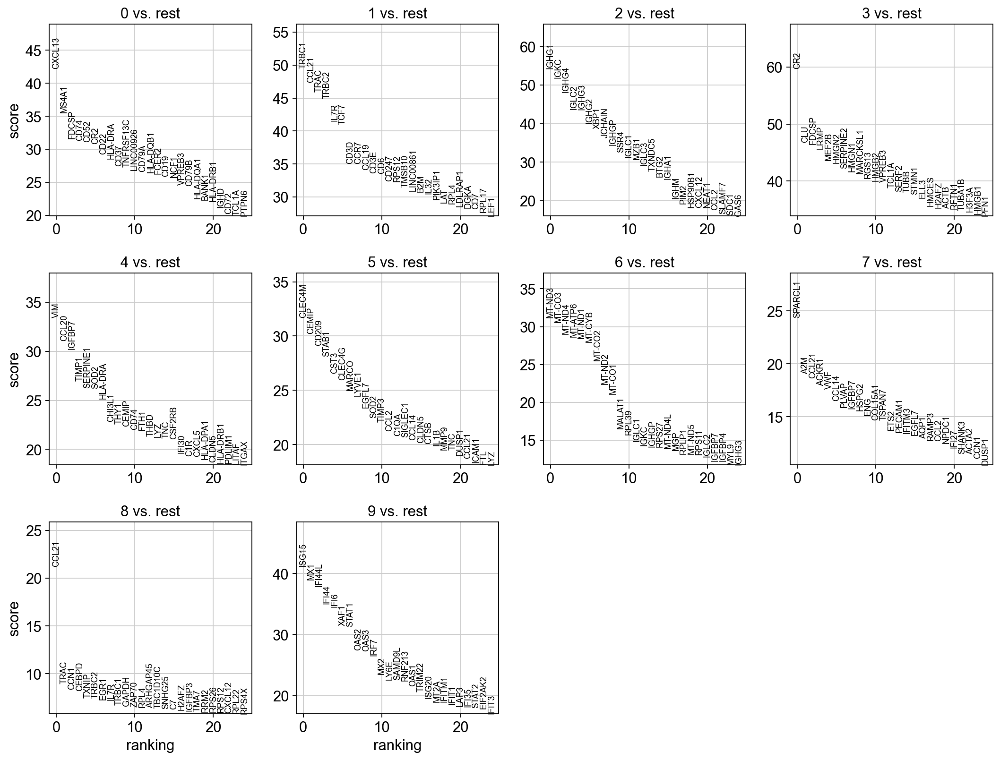

In [25]:
sc.tl.rank_genes_groups(adata, 'clusters', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

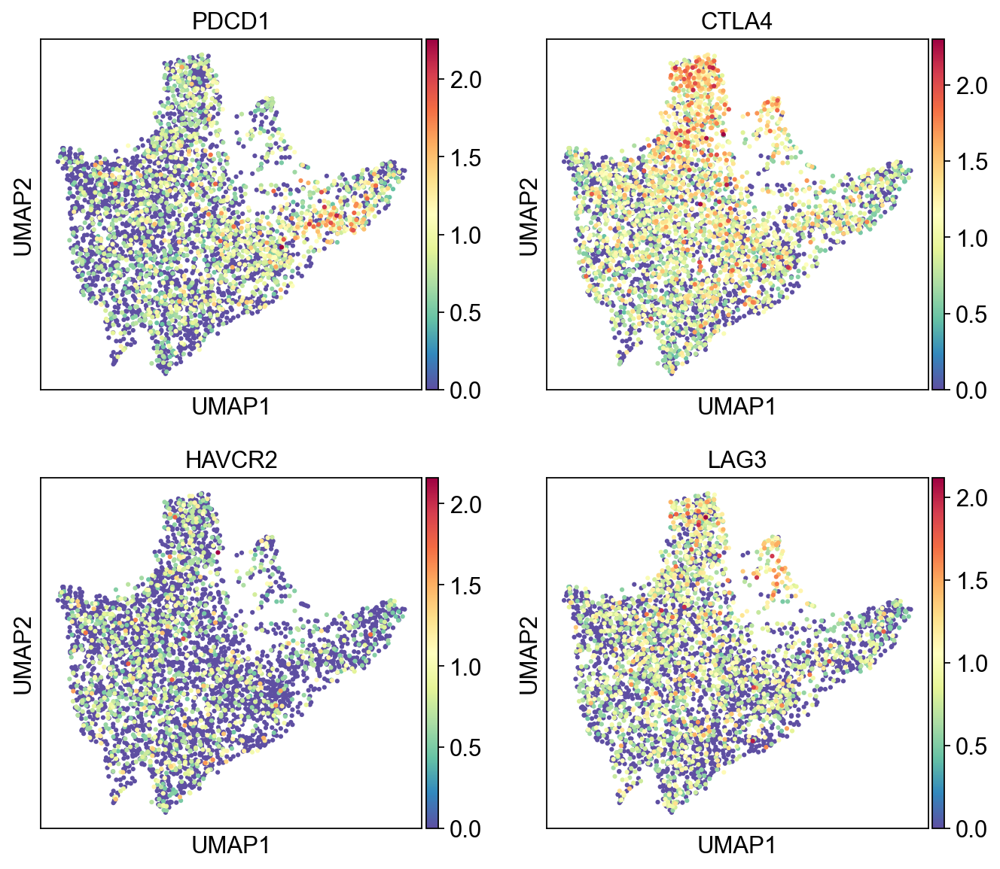

In [26]:
sc.pl.umap(adata, color=["PDCD1", 'CTLA4', 'HAVCR2', 'LAG3'], cmap='Spectral_r', ncols=2)

In [27]:
exhaustion_genes = ['PDCD1','CD160','FASLG','CD244','LAG3','NRP1','TNFRSF6B','TNFRSF1B','CCR5','CCL3',
                    'CCL4','CXCL10','CTLA4','LGALS1','LGALS3','PTPN13','RGS16','ADGRG1','ISG20',
                    'MX1','IRF4','EOMES','PBX3','NFATC1','NR4A2','CKS2','GAS2','ENTPD1','CA2']
sc.tl.score_genes(adata, exhaustion_genes, score_name='exhaustion score')

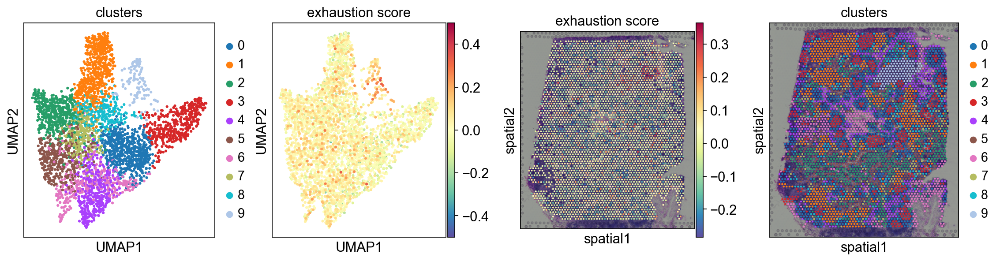

In [28]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(17,4))
sc.pl.umap(adata, color=["clusters"], wspace=0.4, ax=axes[0], show=False)
sc.pl.umap(adata, color=["exhaustion score"], wspace=0.4, ax=axes[1], show=False, cmap='Spectral_r', vmin=-.5, vmax=.5)
sc.pl.spatial(adata, img_key="hires", color=['exhaustion score'], ax=axes[2], show=False, cmap='Spectral_r')
sc.pl.spatial(adata, img_key="hires", color=['clusters'], ax=axes[3], show=False)
plt.subplots_adjust(wspace=.3)

## spatial DE analysis

In [29]:
import SpatialDE
counts = pd.DataFrame(adata.raw.X.todense(), columns=adata.raw.var_names, index=adata.obs_names)
coord = pd.DataFrame(adata.obsm['spatial'], columns=['x_coord', 'y_coord'], index=adata.obs_names)

In [ ]:
results = SpatialDE.run(coord, counts)

In [30]:
results = pd.read_csv('./spatialDE.result.csv', index_col=0)

(0.0, 1.0)

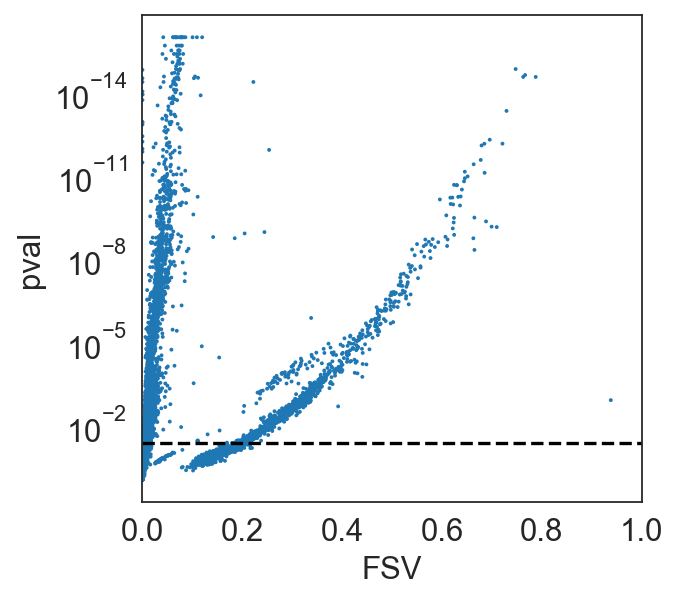

In [31]:
sns.set_style('white')
ax = sns.scatterplot(data=results, x='FSV', y='pval', edgecolor='none', s=3)
ax.invert_yaxis()
ax.set_yscale('log', base=10)
ax.hlines(0.05, xmin=0, xmax=1, linestyle='dashed', color='k')
ax.set_xlim([0, 1])

In [32]:
results_filtered = results[results.qval<=0.00001]
results_filtered.sort_values(by=['FSV', 'pval'], ascending=[False, True]).head(10)

,FSV,M,g,l,max_delta,max_ll,max_mu_hat,max_s2_t_hat,model,n,s2_FSV,s2_logdelta,time,BIC,max_ll_null,LLR,pval,qval
17639,0.982592,4,CRLF1,1722.182579,0.014222,3133.114055,0.289163,0.744702,SE,3861,2.629719e-06,0.006752,0.004262,-6233.193385,2841.139186,291.974869,0.000000e+00,0.000000e+00
10302,0.845789,4,ACAN,903.652528,0.170524,4788.401153,0.042832,0.025574,SE,3861,3.603049e-05,0.001999,0.004236,-9543.767580,4582.801490,205.599663,0.000000e+00,0.000000e+00
6348,0.805073,4,IGKC,248.797504,0.240831,-1318.485346,6.286953,2.253580,SE,3861,7.888417e-07,0.000032,0.004760,2670.005418,-3564.506804,2246.021458,0.000000e+00,0.000000e+00
6917,0.804869,4,IGHG4,248.797504,0.241144,-1232.529890,5.805479,1.950201,SE,3861,8.659576e-07,0.000035,0.005171,2498.094505,-3458.376461,2225.846571,0.000000e+00,0.000000e+00
6684,0.803991,4,CCL21,248.797504,0.242494,-727.100682,4.268608,1.114261,SE,3861,7.781889e-07,0.000031,0.004767,1487.236091,-2869.867834,2142.767152,0.000000e+00,0.000000e+00
1437,0.787781,4,CXCL1,68.500000,0.269335,-2539.349486,0.372539,0.245541,SE,3861,9.462535e-04,0.034224,0.011616,5111.733698,-2601.652955,62.303468,2.997602e-15,7.117949e-14
6921,0.787405,4,IGHG1,248.797504,0.268554,-1496.384296,4.437176,1.261307,SE,3861,8.924700e-07,0.000032,0.005099,3025.803317,-3703.575916,2207.191621,0.000000e+00,0.000000e+00
680,0.766506,4,VIT,68.500000,0.304561,1148.456726,0.045339,0.026422,SE,3861,7.507450e-04,0.024209,0.011891,-2263.878726,1085.884369,62.572357,2.553513e-15,6.092837e-14
2467,0.762726,4,CTSB,68.500000,0.311026,-2180.517314,2.132808,2.350957,SE,3861,7.362664e-04,0.023305,0.010676,4394.069355,-2242.755214,62.237900,2.997602e-15,7.117949e-14
6448,0.751068,4,FDCSP,248.797504,0.329668,-2505.828952,2.756930,0.777911,SE,3861,9.909570e-07,0.000030,0.004772,5044.692630,-4471.129819,1965.300867,0.000000e+00,0.000000e+00


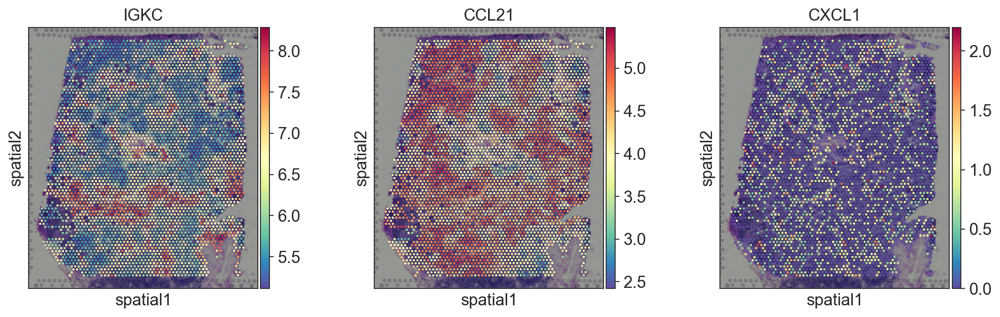

In [33]:
sc.pl.spatial(adata, img_key="hires", color=['IGKC','CCL21', 'CXCL1'], cmap='Spectral_r',
              basis='spatial', img=None, size=1.0,spot_size=None,bw=False, alpha_img=1.
             )